In [1]:
! pip install umap-learn datashader bokeh holoviews scikit-image colorcet

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 98.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 145.4 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 158.7 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 6.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 59.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 167.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 94.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 4.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.6/113.6 kB 100.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.5 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56

In [2]:
import numpy as np
import pandas as pd
import cv2
encoding_array = np.load('Test set semantic features.npy', allow_pickle=True)
encoding_array.shape

(8764, 2048)

In [3]:
df = pd.read_csv('predict result.csv')
df.head()

,image_path,category_ID,category_name,top-1-predID,top-1-predname,top-2-predID,top-2-predname,top-3-predID,top-3-predname,top-npred_accuracy,...,pear-pred_confidence,persimmon-pred_confidence,pineapple-pred_confidence,pomegranate-pred_confidence,pumpkin-pred_confidence,saguaro-pred_confidence,strawberry-pred_confidence,tomato-pred_confidence,watermelon-pred_confidence,zucchini-pred_confidence
0,Fruit-Project_split/val/alligator apple/0.jpg,0,alligator apple,0,alligator apple,16,custard apple,31,papaya,True,...,2.286143e-11,1.277323e-11,3.745659e-13,7.303320e-11,8.737131e-14,5.770625e-12,1.893778e-13,5.283342e-14,6.682146e-14,2.120760e-13
1,Fruit-Project_split/val/alligator apple/1.jpg,0,alligator apple,0,alligator apple,16,custard apple,34,pear,True,...,4.614506e-08,1.549887e-12,2.940635e-13,3.643318e-10,2.239012e-13,3.388853e-14,4.872521e-13,7.798165e-14,2.304572e-13,2.514113e-12
2,Fruit-Project_split/val/alligator apple/104.jpg,0,alligator apple,0,alligator apple,2,avocado,16,custard apple,True,...,6.041791e-07,9.799085e-12,2.603981e-10,1.001620e-09,3.171144e-12,2.917815e-11,9.890008e-11,8.945069e-12,1.178695e-10,5.691795e-10
3,Fruit-Project_split/val/alligator apple/11.jpg,0,alligator apple,31,papaya,29,mango,8,black cherry,False,...,1.867355e-03,1.531276e-05,7.960316e-04,1.985891e-02,5.376117e-05,1.927267e-05,5.118792e-04,3.150327e-03,4.811282e-03,6.389696e-04
4,Fruit-Project_split/val/alligator apple/126.jpg,0,alligator apple,0,alligator apple,26,lime,28,macadamia,True,...,5.790334e-06,1.716318e-09,1.592671e-10,2.046762e-07,5.909728e-11,5.564119e-12,3.852993e-11,5.879171e-11,8.754678e-11,6.151657e-10


In [4]:
classes = df['category_name'].unique()
print(classes)

['alligator apple' 'apple' 'avocado' 'banana' 'barberry' 'bayberry'
 'bell pepper' 'black berry' 'black cherry' 'blueberry' 'bottle gourd'
 'cantaloupe' 'carambola' 'cherry' 'coconut' 'corn kernel' 'custard apple'
 'dragonfruit' 'durian' 'eggplant' 'fig' 'grape' 'jackfruit' 'jalapeno'
 'kiwi' 'lemon' 'lime' 'longan' 'macadamia' 'mango' 'orange' 'papaya'
 'pea' 'peanut' 'pear' 'persimmon' 'pineapple' 'pomegranate' 'pumpkin'
 'saguaro' 'strawberry' 'tomato' 'watermelon' 'zucchini']


In [5]:
import seaborn as sns
marker_list = ['.', ',', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', 'P', '*', 'h', 'H', '+', 'x', 'X', 'D', 'd', '|', '_', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
class_list = np.unique(df['category_name'])
class_list

array(['alligator apple', 'apple', 'avocado', 'banana', 'barberry',
       'bayberry', 'bell pepper', 'black berry', 'black cherry',
       'blueberry', 'bottle gourd', 'cantaloupe', 'carambola', 'cherry',
       'coconut', 'corn kernel', 'custard apple', 'dragonfruit', 'durian',
       'eggplant', 'fig', 'grape', 'jackfruit', 'jalapeno', 'kiwi',
       'lemon', 'lime', 'longan', 'macadamia', 'mango', 'orange',
       'papaya', 'pea', 'peanut', 'pear', 'persimmon', 'pineapple',
       'pomegranate', 'pumpkin', 'saguaro', 'strawberry', 'tomato',
       'watermelon', 'zucchini'], dtype=object)

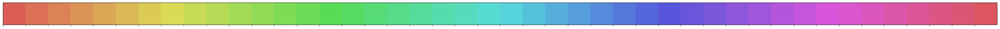

In [6]:
n_class = len(class_list) 
palette = sns.hls_palette(n_class)
sns.palplot(palette)

In [7]:
import random
random.seed(1234)
random.shuffle(marker_list)
random.shuffle(palette)

In [8]:
import umap
import umap.plot
mapper = umap.UMAP(n_neighbors=10, n_components=2, random_state=12).fit(encoding_array)
mapper.embedding_.shape

/environment/miniconda3/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-02-19 10:54:26.149055: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-19 10:54:27.256203: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/environment/miniconda3/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(8764, 2)

In [10]:
X_umap_2d = mapper.embedding_
X_umap_2d.shape

(8764, 2)

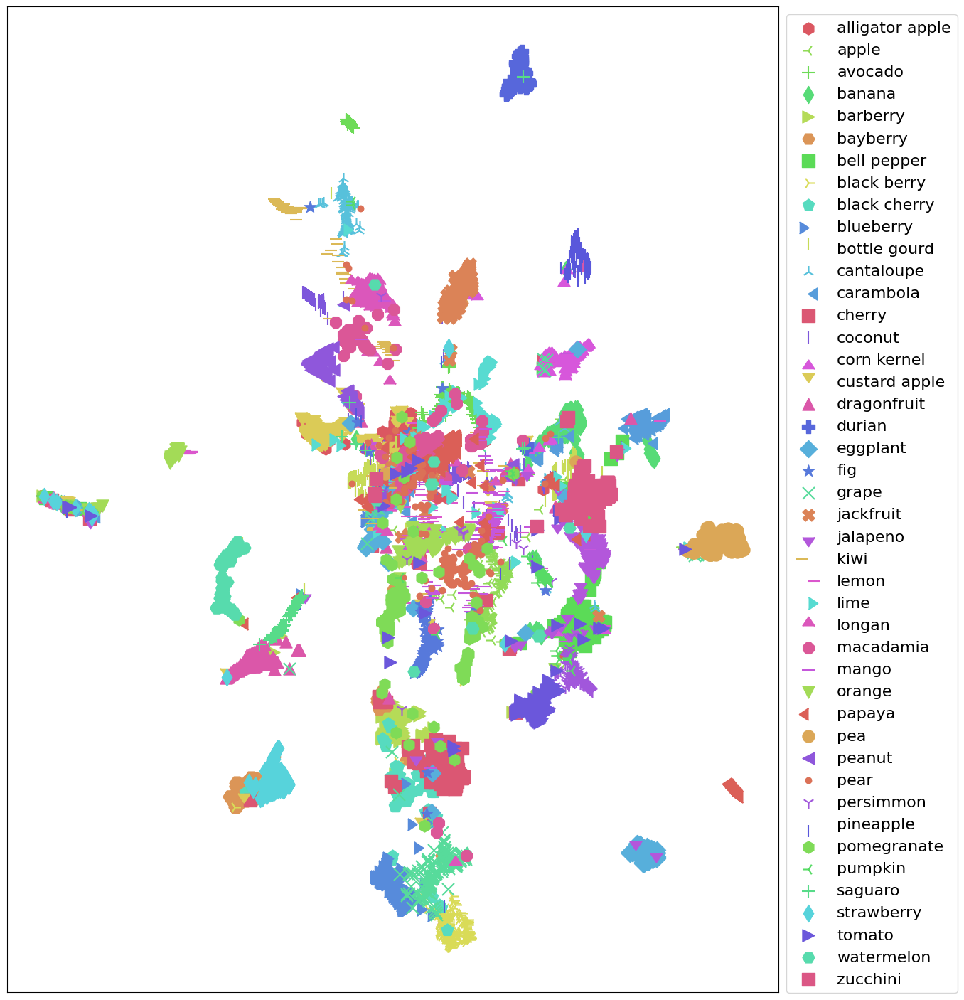

In [11]:
import umap
import matplotlib.pyplot as plt
import umap.plot
show_feature = 'category_name'
plt.figure(figsize=(14, 18))
for idx, fruit in enumerate(class_list):
    
    color = palette[idx]
    marker = marker_list[idx%len(marker_list)]

    indices = np.where(df[show_feature]==fruit)
    plt.scatter(X_umap_2d[indices, 0], X_umap_2d[indices, 1], color=color, marker=marker, label=fruit, s=150)

plt.legend(fontsize=16, markerscale=1, bbox_to_anchor=(1, 1))
plt.xticks([])
plt.yticks([])
plt.savefig('UMAP 2D downscaling visualization.pdf', dpi=600)
plt.show()

In [12]:
import cv2
import torch
from PIL import Image
from torchvision import transforms


device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

model = torch.load('checkpoint/best-0.936.pth')
model = model.eval().to(device)

from torchvision.models.feature_extraction import create_feature_extractor
model_trunc = create_feature_extractor(model, return_nodes={'avgpool': 'semantic_feature'})

test_transform = transforms.Compose([transforms.Resize(256),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

In [13]:
img_path = 'Fruit-Project_split/test/zucchini/313.jpg'
img_pil = Image.open(img_path)
input_img = test_transform(img_pil)
input_img = input_img.unsqueeze(0).to(device)

pred_logits = model_trunc(input_img)
semantic_feature = pred_logits['semantic_feature'].squeeze().detach().cpu().numpy().reshape(1,-1)
semantic_feature.shape

(1, 2048)

In [14]:
new_embedding = mapper.transform(semantic_feature)[0]
new_embedding

array([14.794298,  3.830935], dtype=float32)

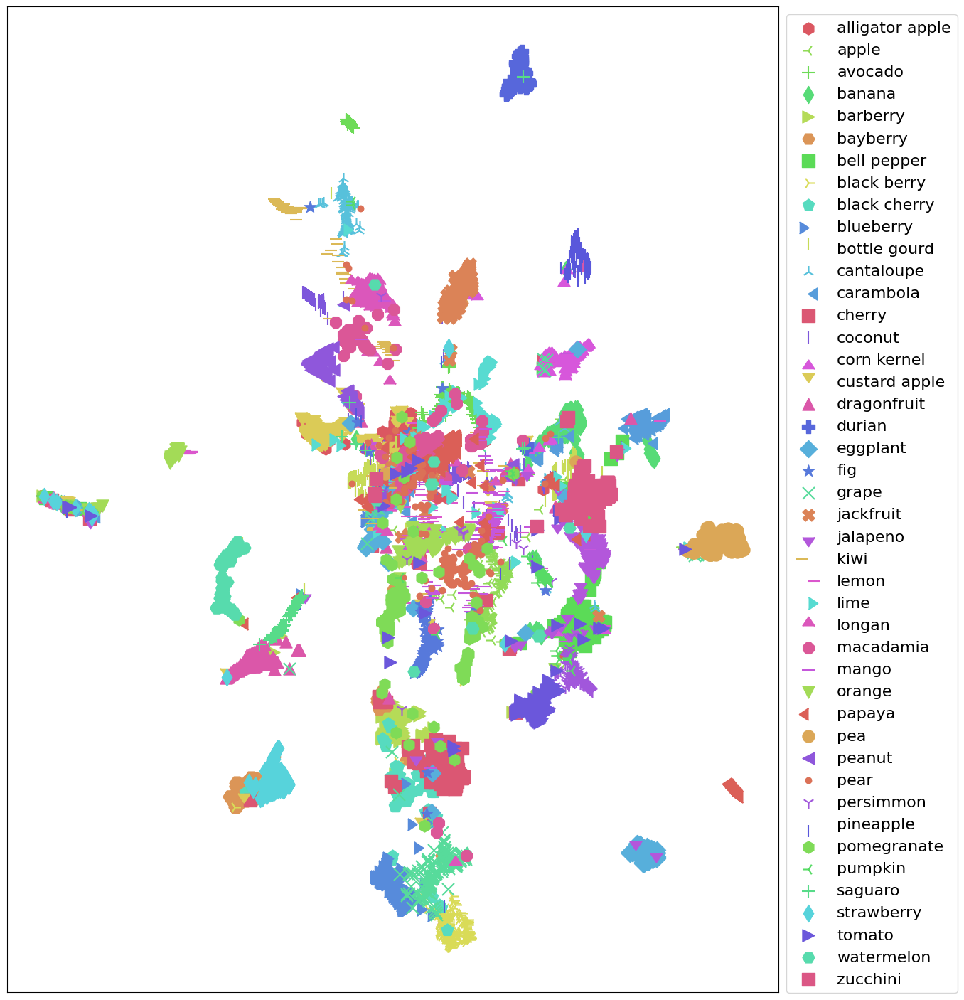

In [15]:
show_feature = 'category_name'
plt.figure(figsize=(14, 18))
for idx, fruit in enumerate(class_list):
    
    color = palette[idx]
    marker = marker_list[idx%len(marker_list)]

    indices = np.where(df[show_feature]==fruit)
    plt.scatter(X_umap_2d[indices, 0], X_umap_2d[indices, 1], color=color, marker=marker, label=fruit, s=150)

plt.legend(fontsize=16, markerscale=1, bbox_to_anchor=(1, 1))
plt.xticks([])
plt.yticks([])
plt.savefig('UMAP 2D downscaling visualization.pdf', dpi=600)
plt.show()

In [19]:
!pip install plotly

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 222.3 MB/s eta 0:00:00a 0:00:01


In [20]:

import plotly.express as px
df_2d = pd.DataFrame()
df_2d['X'] = list(X_umap_2d[:, 0].squeeze())
df_2d['Y'] = list(X_umap_2d[:, 1].squeeze())
df_2d['category_name'] = df['category_name']
df_2d['predcategory'] = df['top-1-predname']
df_2d['image_path'] = df['image_path']
df_2d.to_csv('UMAP-2D.csv', index=False)

new_img_row = {
    'X':new_embedding[0],
    'Y':new_embedding[1],
    'category_name':img_path,
    'image_path':img_path
}

new_df_row = pd.DataFrame([new_img_row])
df_2d = pd.concat([df_2d, new_df_row], ignore_index=True)

In [21]:
df_2d

,X,Y,category_name,predcategory,image_path
0,8.513105,5.060289,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/0.jpg
1,8.653939,4.107865,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/1.jpg
2,8.611531,6.018968,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/104.jpg
3,8.175819,3.664591,alligator apple,papaya,Fruit-Project_split/val/alligator apple/11.jpg
4,8.336414,3.852484,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/126.jpg
...,...,...,...,...,...
8760,14.477379,3.824516,zucchini,zucchini,Fruit-Project_split/val/zucchini/979.jpg
8761,14.255948,3.629441,zucchini,zucchini,Fruit-Project_split/val/zucchini/99.jpg
8762,14.070470,3.765496,zucchini,zucchini,Fruit-Project_split/val/zucchini/994.jpg
8763,14.191362,3.597372,zucchini,zucchini,Fruit-Project_split/val/zucchini/996.jpg


In [22]:
fig = px.scatter(df_2d, 
                 x='X', 
                 y='Y',
                 color=show_feature, 
                 labels=show_feature,
                 symbol=show_feature, 
                 hover_name='image_path',
                 opacity=0.8,
                 width=1000, 
                 height=600
                )
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()
fig.write_html('UMAP 2D downscaling plotly visualization.html')

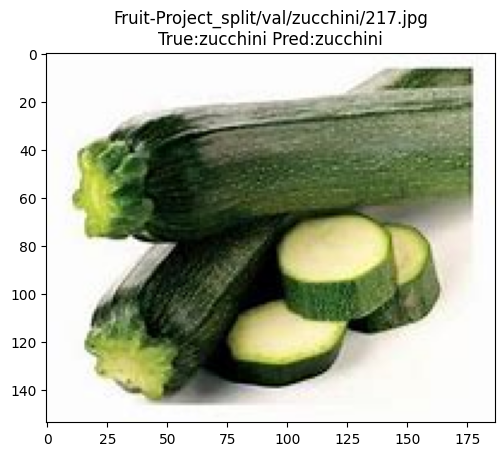

In [23]:
import cv2
import matplotlib.pyplot as plt

img_path_temp = 'Fruit-Project_split/val/zucchini/217.jpg'
img_bgr = cv2.imread(img_path_temp)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

# Filter DataFrame based on image_path
temp_df = df[df['image_path'] == img_path_temp]

# Check if there are matching rows
if not temp_df.empty:
    # Take the first row
    row = temp_df.iloc[0]
    
    # Construct the title string
    title_str = img_path_temp + '\nTrue:' + row['category_name'] + ' Pred:' + row['top-1-predname']
    
    # Set the title
    plt.title(title_str)
    plt.show()
else:
    print("No matching rows found in the DataFrame for image path:", img_path_temp)


In [24]:
mapper = umap.UMAP(n_neighbors=10, n_components=3, random_state=12).fit(encoding_array)
X_umap_3d = mapper.embedding_
X_umap_3d.shape

/environment/miniconda3/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



(8764, 3)

In [25]:
show_feature = 'category_name'
df_3d = pd.DataFrame()
df_3d['X'] = list(X_umap_3d[:, 0].squeeze())
df_3d['Y'] = list(X_umap_3d[:, 1].squeeze())
df_3d['Z'] = list(X_umap_3d[:, 2].squeeze())
df_3d['category_name'] = df['category_name']
df_3d['predcategory'] = df['top-1-predname']
df_3d['image_path'] = df['image_path']
df_3d.to_csv('UMAP-3D.csv', index=False)

In [26]:
df_3d

,X,Y,Z,category_name,predcategory,image_path
0,10.243287,4.130756,2.471704,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/0.jpg
1,10.301745,3.660977,3.445513,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/1.jpg
2,10.212893,5.231889,2.947917,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/104.jpg
3,10.605932,3.457188,3.973031,alligator apple,papaya,Fruit-Project_split/val/alligator apple/11.jpg
4,10.557795,3.459153,3.732228,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/126.jpg
...,...,...,...,...,...,...
8759,11.669774,2.603427,-0.496479,zucchini,zucchini,Fruit-Project_split/val/zucchini/972.jpg
8760,12.929647,2.387763,0.725076,zucchini,zucchini,Fruit-Project_split/val/zucchini/979.jpg
8761,12.970402,2.455760,1.339442,zucchini,zucchini,Fruit-Project_split/val/zucchini/99.jpg
8762,12.715716,2.403920,1.201219,zucchini,zucchini,Fruit-Project_split/val/zucchini/994.jpg


In [27]:
fig = px.scatter_3d(df_3d, 
                    x='X', 
                    y='Y', 
                    z='Z',
                    color=show_feature, 
                    labels=show_feature,
                    symbol=show_feature, 
                    hover_name='image_path',
                    opacity=0.6,
                    width=1000, 
                    height=800)


fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()
fig.write_html('UMAP 3D downscaling plotly visualization.html')

In [30]:
new_embedding = mapper.transform(semantic_feature)[0]

new_img_row = {
    'X':new_embedding[0],
    'Y':new_embedding[1],
    'Z':new_embedding[2],
    'category_name':img_path,
    'image_path':img_path
}

df_new_img = pd.DataFrame([new_img_row])

# Concatenate the new_img_row DataFrame with the existing df_3d DataFrame
df_3d = pd.concat([df_3d, df_new_img], ignore_index=True)

In [31]:
df_3d 

,X,Y,Z,category_name,predcategory,image_path
0,10.243287,4.130756,2.471704,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/0.jpg
1,10.301745,3.660977,3.445513,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/1.jpg
2,10.212893,5.231889,2.947917,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/104.jpg
3,10.605932,3.457188,3.973031,alligator apple,papaya,Fruit-Project_split/val/alligator apple/11.jpg
4,10.557795,3.459153,3.732228,alligator apple,alligator apple,Fruit-Project_split/val/alligator apple/126.jpg
...,...,...,...,...,...,...
8761,12.970402,2.455760,1.339442,zucchini,zucchini,Fruit-Project_split/val/zucchini/99.jpg
8762,12.715716,2.403920,1.201219,zucchini,zucchini,Fruit-Project_split/val/zucchini/994.jpg
8763,12.942133,2.380810,1.244148,zucchini,zucchini,Fruit-Project_split/val/zucchini/996.jpg
8764,13.181876,2.292532,0.604866,Fruit-Project_split/test/zucchini/313.jpg,NaN,Fruit-Project_split/test/zucchini/313.jpg


In [32]:
fig = px.scatter_3d(df_3d, 
                    x='X', 
                    y='Y', 
                    z='Z',
                    color=show_feature, 
                    labels=show_feature,
                    symbol=show_feature, 
                    hover_name='image_path',
                    opacity=0.6,
                    width=1000, 
                    height=800)


fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()
fig.write_html('UMAP 3D descending plotly visualization.html')